# L/S Equity Strategy
Factor investing as an investment strategy has been studied and used in practice for multiple decade. The last time I checked, there we more than 600 factors studied in academic papers. However, the factors that I know have stood the test of time and have real statistical edge in the markets are momentum and mean reversion. Hence, I utilised the classic 12-2 month momentum and short-term mean reverting returns as my starting point. My overall goal is to start with individual know factors and add my own factors on top of it before creating a method to implement the multiple factors on a portfolio level. 

### Load Packages

In [4]:
import os
import pickle
import numpy as np
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import mstats
from sklearn import linear_model
from sklearn import tree
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import TimeSeriesSplit

# Import local libraries
import alphalens as al
import pyfolio as pf
from factor_strategy.utils import *
from factor_strategy.factors import *
from factor_strategy.backtest import Backtest

# Settings
plt.rcParams['figure.figsize'] = 15, 7
sns.set_theme(style="whitegrid")

## Load Data

In [5]:
# Load Securities Universe data
basket = pd.read_csv("snp_constituents.csv")
basket["Symbol"] = basket["Symbol"].apply(lambda x : x.replace(".", "-", 1))
basket.head()

,Symbol,Name,Sector
0,MMM,3M,Industrials
1,AOS,A. O. Smith,Industrials
2,ABT,Abbott Laboratories,Health Care
3,ABBV,AbbVie,Health Care
4,ABMD,Abiomed,Health Care


In [6]:
# Load price data
data = pd.read_csv("AllPriceData.csv", header=[0, 1], index_col=0, parse_dates=True)
data.head()

close                                                        \
                  A AAL AAP      AAPL ABBV      ABC     ABMD      ABT ACN   
date                                                                        
2000-01-03  67.8190 NaN NaN  111.9384  NaN  15.1014  36.5000  34.8937 NaN   
2000-01-04  61.7554 NaN NaN  102.5024  NaN  14.0702  35.6250  33.8968 NaN   
2000-01-05  58.7530 NaN NaN  103.9976  NaN  15.1620  36.0000  33.8345 NaN   
2000-01-06  55.5739 NaN NaN   94.9984  NaN  16.3142  36.0625  35.0183 NaN   
2000-01-07  61.2255 NaN NaN   99.5008  NaN  18.4370  35.8750  35.3922 NaN   

                     ... stock splits                                          \
               ADBE  ...         WLTW WYNN  XEL XLNX  XYL  YUM ZBRA  ZBH ZION   
date                 ...                                                        
2000-01-03  65.5626  ...          1.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0   
2000-01-04  60.0626  ...          1.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0   
2000-01-05  61.2500  ...          1.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0   
2000-01-06  61.7500  ...          1.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0   
2000-01-07  64.7500  ...          1.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0   

                 
            ZTS  
date             
2000-01-03  1.0  
2000-01-04  1.0  
2000-01-05  1.0  
2000-01-06  1.0  
2000-01-07  1.0  

[5 rows x 1515 columns]

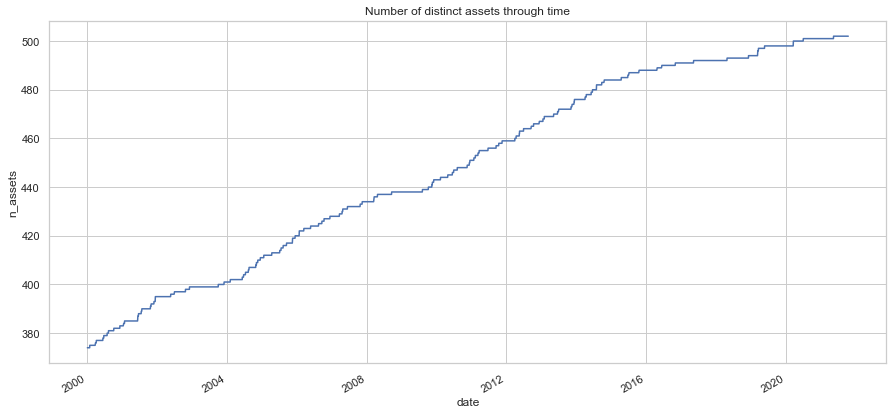

In [7]:
# Analyzing universe of securities
df = data[["close"]].unstack().swaplevel(0,1).sort_index()
df.groupby('date').count().plot(ylabel='n_assets',title='Number of distinct assets through time');

It is shown that not all historical S&P 500 constituents are available in our data set hence there will be some form of survirvorship bias that exist in our analysis and backtest. 

Before carrying out any exploratory analysis, I will decided on the training, validation, and testing segments of the data to prevent any look ahead bias during the  exploratory phase. As a rule of thumb, I will keep at least the last 20% of my data as the test data. 

In [77]:
## Train/Test Split
train_start = data.index[data.index > "2009-12-31"][0] # training starting point
train_end = data.index[data.index <= "2016-12-31"][-1]
vali_start = data.index[data.index > "2016-12-31"][0]
vali_end = data.index[data.index < "2019-01-01"][-1]
test_start = data.index[data.index > "2019-01-01"][5]
test_end = data.index[data.index < "2021-10-01"][-1]

## Feature Creation and EDA

This section will compute the factors that I intend to use. I have decided to add volatility as a factor. My intention is to explore if lower volatility assets will result in higher return. 

In [78]:
### Computing the daily return factor adjusted for dividends and splits
df = ((data["stock splits"] * data['close']) + data['dividends']) / data['close'].shift(1) - 1.0 
data = merge(data, df, "return")

# Compute indexed price
df.fillna(0, inplace = True)
df = (df + 1).cumprod()  
data = merge(data, df, "price_index")
data.head()

close                                                        \
                  A AAL AAP      AAPL ABBV      ABC     ABMD      ABT ACN   
date                                                                        
2000-01-03  67.8190 NaN NaN  111.9384  NaN  15.1014  36.5000  34.8937 NaN   
2000-01-04  61.7554 NaN NaN  102.5024  NaN  14.0702  35.6250  33.8968 NaN   
2000-01-05  58.7530 NaN NaN  103.9976  NaN  15.1620  36.0000  33.8345 NaN   
2000-01-06  55.5739 NaN NaN   94.9984  NaN  16.3142  36.0625  35.0183 NaN   
2000-01-07  61.2255 NaN NaN   99.5008  NaN  18.4370  35.8750  35.3922 NaN   

                     ... price_index                                     \
               ADBE  ...         XEL      XLNX       XOM      XRAY  XYL   
date                 ...                                                  
2000-01-03  65.5626  ...    1.000000  1.000000  1.000000  1.000000  1.0   
2000-01-04  60.0626  ...    1.023026  0.977273  0.980846  1.000000  1.0   
2000-01-05  61.2500  ...    1.062500  0.955882  1.034318  1.017285  1.0   
2000-01-06  61.7500  ...    1.052632  0.872995  1.087789  1.018617  1.0   
2000-01-07  64.7500  ...    1.052632  0.971925  1.084597  1.015957  1.0   

                                                    
                 YUM  ZBH      ZBRA      ZION  ZTS  
date                                                
2000-01-03  1.000000  1.0  1.000000  1.000000  1.0  
2000-01-04  0.979899  1.0  0.985570  0.951577  1.0  
2000-01-05  0.984925  1.0  1.004438  0.950450  1.0  
2000-01-06  0.976549  1.0  0.950056  0.963964  1.0  
2000-01-07  0.954774  1.0  0.939509  0.966216  1.0  

[5 rows x 2525 columns]

In [7]:
### Creating the 3 technical factors for varying time horizons
mom6_factor_value = calc_momentum_factor(data, 22, 126, False)
mom12_factor_value = calc_momentum_factor(data, 22, 252, False)
revert10_factor_value = calc_mean_reversion_factor(data, 10, False)
revert20_factor_value = calc_mean_reversion_factor(data, 20, False)
vol6_factor = calc_volatility_factor(data, 126, False)
vol12_factor = calc_volatility_factor(data, 252, False)
# The code for the computing each factor is written and imported into this notebook from "factors.py" to keep this notebook neat. 

In [8]:
# Standardize factors by time
mom6_factor_value = standardize(mom6_factor_value, "time")
mom12_factor_value = standardize(mom12_factor_value, "time")
revert10_factor_value = standardize(revert10_factor_value, "time")
revert20_factor_value = standardize(revert20_factor_value, "time")
vol6_factor = standardize(vol6_factor, "time", use_median=False)
vol12_factor = standardize(vol12_factor, "time", use_median=False)

In [9]:
# Standardize factors cross-sectionally
mom6_factor_value = standardize(mom6_factor_value, "cross")
mom12_factor_value = standardize(mom12_factor_value, "cross")
revert10_factor_value = standardize(revert10_factor_value, "cross")
revert20_factor_value = standardize(revert20_factor_value, "cross")
vol6_factor = standardize(vol6_factor, "cross", use_median=False)
vol12_factor = standardize(vol12_factor, "cross", use_median=False)

Here I plot the distribution of each factor value on its own to analyze how the factor values are distributed. 

In [10]:
# Format factors for each security into a dataframe
factor_names = [
    '6M MoM',
    '12M MoM',
    '10D revert',
    '20D revert', 
    '6M Vol',
    '12M Vol'
]

factor_values = [
    mom6_factor_value.unstack().swaplevel(0,1).sort_index(),
    mom12_factor_value.unstack().swaplevel(0,1).sort_index(),
    revert10_factor_value.unstack().swaplevel(0,1).sort_index(),
    revert20_factor_value.unstack().swaplevel(0,1).sort_index(),
    vol6_factor.unstack().swaplevel(0,1).sort_index(),
    vol12_factor.unstack().swaplevel(0,1).sort_index()
]


factor_dict = dict(zip(factor_names, factor_values))
factor_dict["price"] = data["price_index"].unstack().swaplevel(0,1).sort_index()
factor_df = pd.concat(factor_dict.values(), axis=1, keys=factor_dict.keys())

# Drop outliers
upper = factor_df[factor_names].quantile(0.99)
lower = factor_df[factor_names].quantile(0.01)
adj_factor_df = factor_df[~((factor_df < (lower)) |(factor_df > (upper))).any(axis=1)].copy()

# Drop data before 2009
adj_factor_df = adj_factor_df.loc[train_start : vali_end]

C:\Users\User\AppData\Local\Temp/ipykernel_17508/4046784474.py:28: FutureWarning: Automatic reindexing on DataFrame vs Series comparisons is deprecated and will raise ValueError in a future version.  Do `left, right = left.align(right, axis=1, copy=False)` before e.g. `left == right`
  adj_factor_df = factor_df[~((factor_df < (lower)) |(factor_df > (upper))).any(axis=1)].copy()


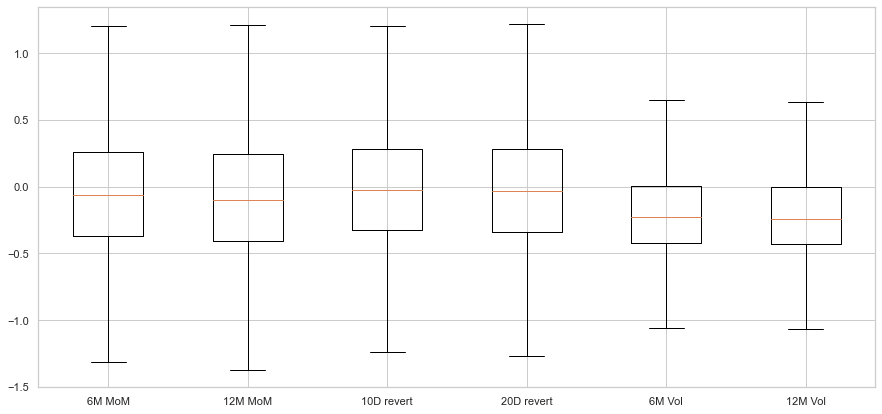

In [11]:
# Multiple box plots on one Axes
fig, ax = plt.subplots()
ax.boxplot(
    adj_factor_df.loc[:vali_end, factor_names].dropna(), 
    showfliers=False, 
    labels=factor_names
)
plt.show()

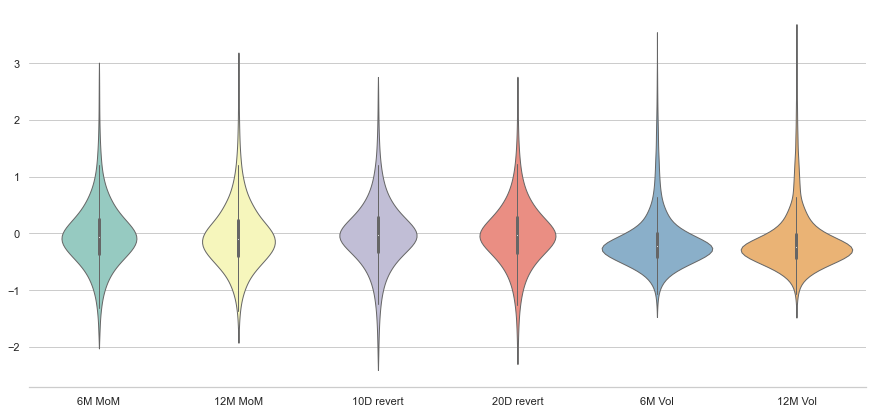

In [12]:
sns.violinplot(
    data=adj_factor_df.loc[:vali_end, factor_names].dropna(), 
    palette="Set3", 
    bw=.2, 
    cut=1, 
    linewidth=1
)
sns.despine(left=True)

Excluding extreme outliers from data then our model should be satisfactory enough (in a sense that the factors are normally distributed) to begin inputing into a linear model. 

In [13]:
df = adj_factor_df[factor_names].corr()
df.style.background_gradient(cmap='coolwarm')

,6M MoM,12M MoM,10D revert,20D revert,6M Vol,12M Vol
6M MoM,1.000000,0.638913,0.011726,0.010356,0.093524,0.137891
12M MoM,0.638913,1.000000,0.022807,0.028433,0.161220,0.193641
10D revert,0.011726,0.022807,1.000000,0.652726,0.057445,0.059335
20D revert,0.010356,0.028433,0.652726,1.000000,0.076085,0.082813
6M Vol,0.093524,0.161220,0.057445,0.076085,1.000000,0.946564
12M Vol,0.137891,0.193641,0.059335,0.082813,0.946564,1.000000


Finally, Based on the correlation plot, it is shown that the similar factors are highly correlated with each other. When the need comes to choose only one parameter per factor type, I will choose the the one with the longest lookback as they have a lower turnover (This show shown in the analysis below.)

## Preliminary Analysis

The first tear sheet below shows the returns, performance, and turnover analysis for the 6-2 month momentum factor. The top decile shows higher forward returns as expected. However, the bottom decile produces an average return that is positive. This might suggest that there is some form of mean reverting behavior for the stocks in the bottom decile of 6-2 momentum factors. 

Dropped 7.1% entries from factor data: 7.1% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!
Returns Analysis


,1D,5D,10D,20D
Ann. alpha,0.003,0.010,0.014,0.021
beta,-0.027,-0.039,-0.061,-0.090
Mean Period Wise Return Top Quantile (bps),0.192,0.402,0.697,1.079
Mean Period Wise Return Bottom Quantile (bps),0.809,0.496,0.572,0.374
Mean Period Wise Spread (bps),-0.617,-0.067,0.144,0.716


<Figure size 1080x504 with 0 Axes>

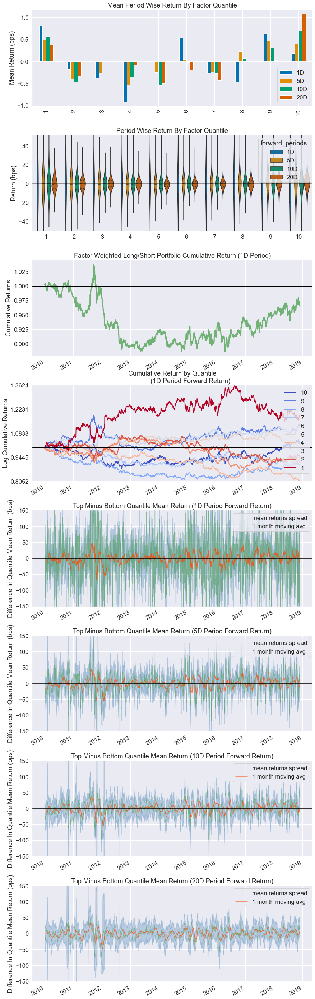

In [19]:
df = adj_factor_df
df.index = df.index.rename(["date", "asset"])

factor_data = al.utils.get_clean_factor_and_forward_returns(
    df[train_start:vali_end]["6M MoM"],
    df[train_start:vali_end]["price"].unstack(),
    quantiles = 10,
    periods = (1,5,10,20),
    filter_zscore = 30
)
al.tears.create_returns_tear_sheet(factor_data)

c:\dev\python\alphalens\alphalens\utils.py:910: UserWarning: Skipping return periods that aren't exact multiples of days.
  warnings.warn(


Turnover Analysis


,1D,5D,10D,20D
Quantile 1 Mean Turnover,0.105,0.233,0.323,0.448
Quantile 2 Mean Turnover,0.236,0.472,0.592,0.703
Quantile 3 Mean Turnover,0.313,0.574,0.684,0.774
Quantile 4 Mean Turnover,0.356,0.622,0.725,0.802
Quantile 5 Mean Turnover,0.378,0.643,0.739,0.812
Quantile 6 Mean Turnover,0.385,0.651,0.744,0.814
Quantile 7 Mean Turnover,0.366,0.630,0.729,0.805
Quantile 8 Mean Turnover,0.321,0.585,0.693,0.779
Quantile 9 Mean Turnover,0.246,0.485,0.604,0.710
Quantile 10 Mean Turnover,0.117,0.251,0.340,0.458


,1D,5D,10D,20D
Mean Factor Rank Autocorrelation,0.986,0.937,0.88,0.774


<Figure size 1080x504 with 0 Axes>

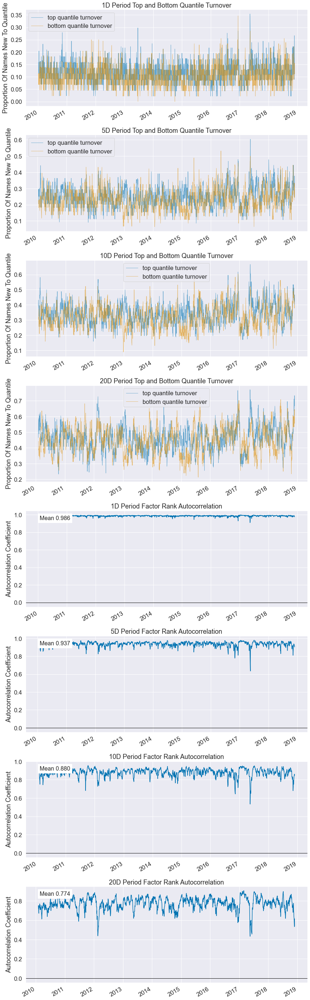

In [20]:
al.tears.create_turnover_tear_sheet(factor_data)

The tear sheeet below shows the return profile for the 12-2 month momentum factor. The profile shows that top long decile is a good candidate for a long portfolio while the bottom decile can be a good short portfolio candidate. It also appears that the returns for a long top decile portfolio is more robust than return in the returns for a short bottom decile portfolio. 

Dropped 7.1% entries from factor data: 7.1% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!
Returns Analysis


,1D,5D,10D,20D
Ann. alpha,0.005,0.012,0.015,0.017
beta,0.000,-0.012,-0.026,-0.033
Mean Period Wise Return Top Quantile (bps),1.044,0.872,0.774,0.696
Mean Period Wise Return Bottom Quantile (bps),0.343,-0.170,-0.429,-0.760
Mean Period Wise Spread (bps),0.701,1.066,1.230,1.480


<Figure size 1080x504 with 0 Axes>

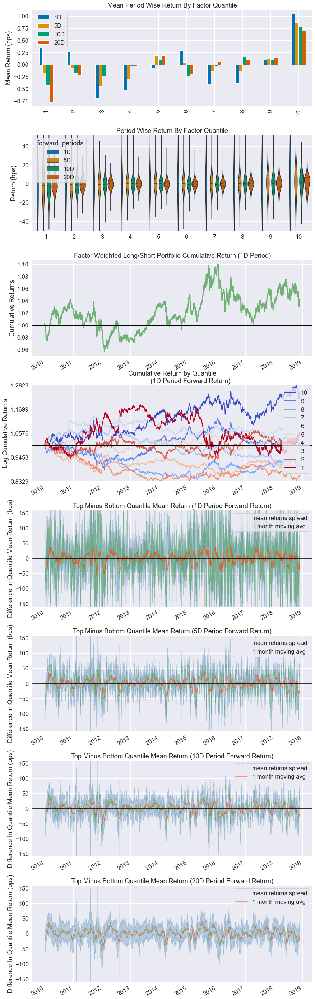

In [21]:
df = adj_factor_df
df.index = df.index.rename(["date", "asset"])

factor_data = al.utils.get_clean_factor_and_forward_returns(
    df[train_start:vali_end]["12M MoM"],
    df[train_start:vali_end]["price"].unstack(),
    quantiles = 10,
    periods = (1,5,10,20),
    filter_zscore = 30
)
al.tears.create_returns_tear_sheet(factor_data)

c:\dev\python\alphalens\alphalens\utils.py:910: UserWarning: Skipping return periods that aren't exact multiples of days.
  warnings.warn(


Turnover Analysis


,1D,5D,10D,20D
Quantile 1 Mean Turnover,0.078,0.169,0.231,0.315
Quantile 2 Mean Turnover,0.173,0.359,0.470,0.585
Quantile 3 Mean Turnover,0.232,0.457,0.575,0.676
Quantile 4 Mean Turnover,0.263,0.503,0.617,0.713
Quantile 5 Mean Turnover,0.279,0.528,0.637,0.731
Quantile 6 Mean Turnover,0.284,0.533,0.645,0.740
Quantile 7 Mean Turnover,0.267,0.510,0.625,0.723
Quantile 8 Mean Turnover,0.231,0.461,0.578,0.682
Quantile 9 Mean Turnover,0.177,0.365,0.476,0.593
Quantile 10 Mean Turnover,0.092,0.194,0.258,0.346


,1D,5D,10D,20D
Mean Factor Rank Autocorrelation,0.993,0.97,0.943,0.892


<Figure size 1080x504 with 0 Axes>

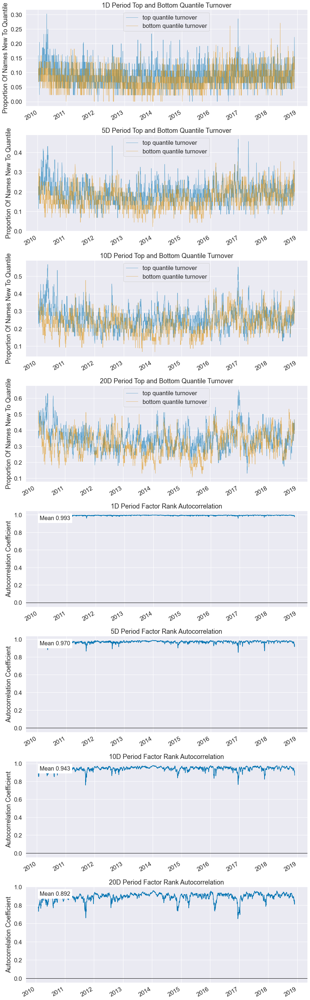

In [22]:
al.tears.create_turnover_tear_sheet(factor_data)

The tear sheet below shows the return profile for the 10-day mean reversion factor. This factor is computed as the return between the close price today versus the close price 10-days ago. Is is shown that the top decile of equities are the best short candidate and the bottom decile of equities ranked with this factor are the best long candidates. It is also shown that the more frequent we rebalance this strategty, the better our returns are (excluding transaction cost). 

Dropped 7.1% entries from factor data: 7.1% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!
Returns Analysis


,1D,5D,10D,20D
Ann. alpha,0.092,0.049,0.032,0.016
beta,0.068,0.074,0.055,0.051
Mean Period Wise Return Top Quantile (bps),4.652,2.999,2.089,1.416
Mean Period Wise Return Bottom Quantile (bps),-5.204,-3.094,-1.828,-0.950
Mean Period Wise Spread (bps),9.857,6.076,3.901,2.344


<Figure size 1080x504 with 0 Axes>

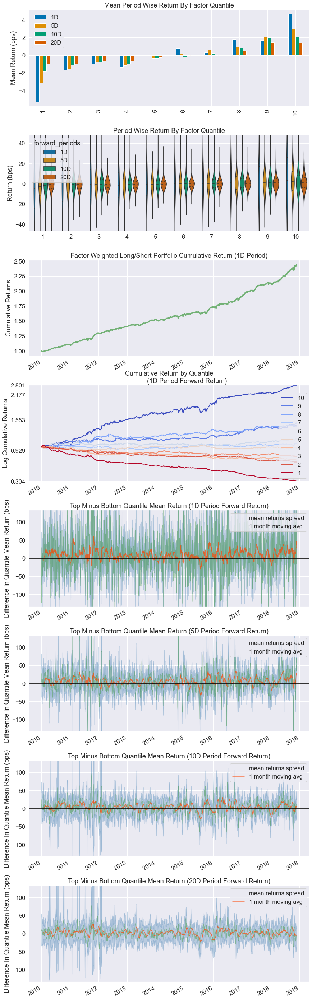

In [14]:
df = adj_factor_df
df.index = df.index.rename(["date", "asset"])

factor_data = al.utils.get_clean_factor_and_forward_returns(
    -df[train_start:vali_end]["10D revert"],
    df[train_start:vali_end]["price"].unstack(),
    quantiles = 10,
    periods = (1,5,10,20),
    filter_zscore = 30
)
al.tears.create_returns_tear_sheet(factor_data)

c:\dev\python\alphalens\alphalens\utils.py:910: UserWarning: Skipping return periods that aren't exact multiples of days.
  warnings.warn(


Turnover Analysis


,1D,5D,10D,20D
Quantile 1 Mean Turnover,0.304,0.663,0.888,0.877
Quantile 2 Mean Turnover,0.578,0.821,0.902,0.902
Quantile 3 Mean Turnover,0.678,0.852,0.897,0.898
Quantile 4 Mean Turnover,0.722,0.866,0.895,0.897
Quantile 5 Mean Turnover,0.735,0.870,0.894,0.894
Quantile 6 Mean Turnover,0.737,0.870,0.892,0.895
Quantile 7 Mean Turnover,0.721,0.866,0.896,0.897
Quantile 8 Mean Turnover,0.674,0.853,0.900,0.899
Quantile 9 Mean Turnover,0.579,0.822,0.900,0.899
Quantile 10 Mean Turnover,0.306,0.659,0.887,0.876


,1D,5D,10D,20D
Mean Factor Rank Autocorrelation,0.87,0.443,-0.017,-0.002


<Figure size 1080x504 with 0 Axes>

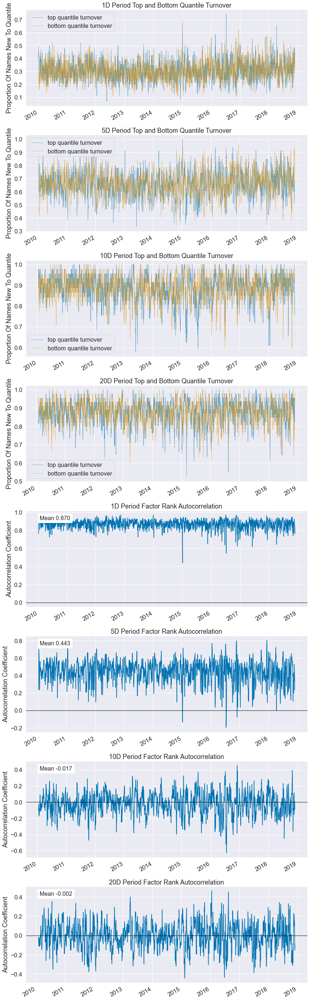

In [15]:
al.tears.create_turnover_tear_sheet(factor_data)

The next tear sheer below shows the 20-day mean reversion factor performance. The return profile looks extreamly similar to the return profile of the 10-day mean reverting factor. 

Dropped 7.1% entries from factor data: 7.1% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!
Returns Analysis


,1D,5D,10D,20D
Ann. alpha,0.080,0.048,0.032,0.019
beta,0.073,0.078,0.058,0.060
Mean Period Wise Return Top Quantile (bps),5.479,4.028,3.040,1.982
Mean Period Wise Return Bottom Quantile (bps),-4.702,-2.948,-1.827,-1.285
Mean Period Wise Spread (bps),10.180,6.941,4.826,3.226


<Figure size 1080x504 with 0 Axes>

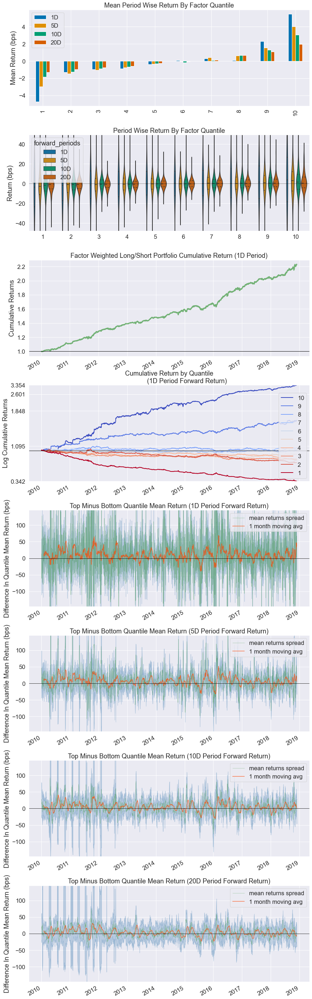

In [25]:
df = adj_factor_df
df.index = df.index.rename(["date", "asset"])

factor_data = al.utils.get_clean_factor_and_forward_returns(
    -df[train_start:vali_end]["20D revert"],
    df[train_start:vali_end]["price"].unstack(),
    quantiles = 10,
    periods = (1,5,10,20),
    filter_zscore = 30
)
al.tears.create_returns_tear_sheet(factor_data)

c:\dev\python\alphalens\alphalens\utils.py:910: UserWarning: Skipping return periods that aren't exact multiples of days.
  warnings.warn(


Turnover Analysis


,1D,5D,10D,20D
Quantile 1 Mean Turnover,0.229,0.498,0.672,0.886
Quantile 2 Mean Turnover,0.468,0.733,0.824,0.904
Quantile 3 Mean Turnover,0.576,0.794,0.855,0.899
Quantile 4 Mean Turnover,0.625,0.819,0.866,0.895
Quantile 5 Mean Turnover,0.645,0.829,0.874,0.893
Quantile 6 Mean Turnover,0.642,0.828,0.872,0.894
Quantile 7 Mean Turnover,0.621,0.818,0.868,0.896
Quantile 8 Mean Turnover,0.568,0.790,0.854,0.899
Quantile 9 Mean Turnover,0.463,0.729,0.819,0.903
Quantile 10 Mean Turnover,0.225,0.490,0.667,0.879


,1D,5D,10D,20D
Mean Factor Rank Autocorrelation,0.933,0.702,0.45,-0.013


<Figure size 1080x504 with 0 Axes>

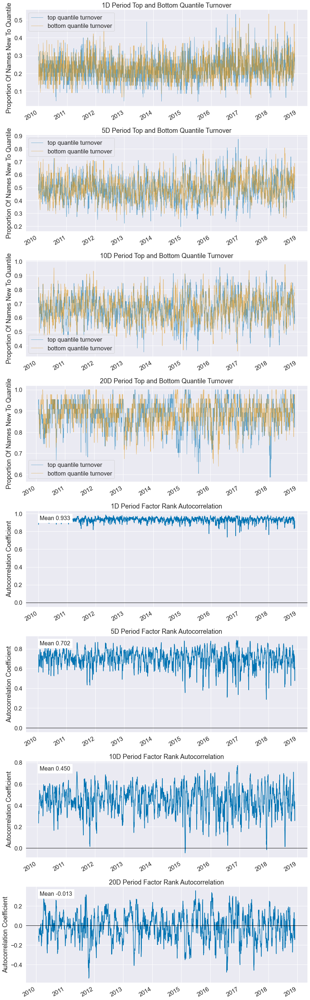

In [26]:
al.tears.create_turnover_tear_sheet(factor_data)

Lastly, the tear sheets below shows the return profile of the 12-month and 6-month historical volatility factor. This factor is computed as the standard deviation of the daily return over the past 6 and 12 months respectively. It is shown in both cases that the top decile provided the best long-candidate. Equities in the bottom decile does not appear to show any conclusive statistical pattern as being a good long or short candidate.

Dropped 7.1% entries from factor data: 7.1% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!
Returns Analysis


,1D,5D,10D,20D
Ann. alpha,0.005,0.008,0.013,0.015
beta,0.083,0.084,0.072,0.071
Mean Period Wise Return Top Quantile (bps),2.191,2.285,2.382,2.419
Mean Period Wise Return Bottom Quantile (bps),0.861,0.382,0.167,0.083
Mean Period Wise Spread (bps),1.330,1.890,2.198,2.319


<Figure size 1080x504 with 0 Axes>

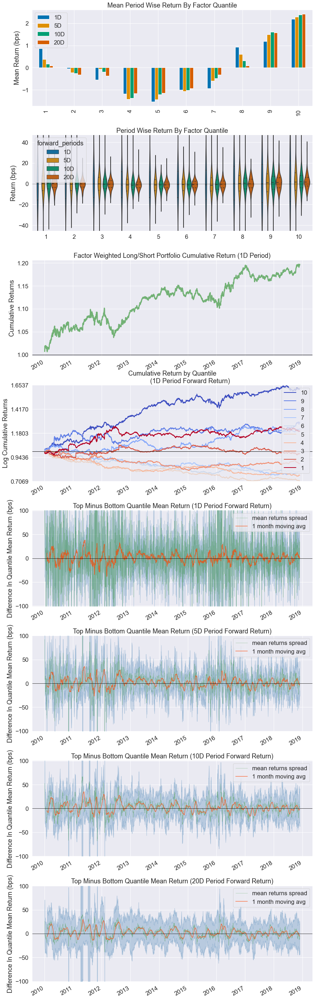

In [27]:
df = adj_factor_df
df.index = df.index.rename(["date", "asset"])

factor_data = al.utils.get_clean_factor_and_forward_returns(
    df[train_start:vali_end]["6M Vol"],
    df[train_start:vali_end]["price"].unstack(),
    quantiles = 10,
    periods = (1,5,10,20),
    filter_zscore = 30
)
al.tears.create_returns_tear_sheet(factor_data)

c:\dev\python\alphalens\alphalens\utils.py:910: UserWarning: Skipping return periods that aren't exact multiples of days.
  warnings.warn(


Turnover Analysis


,1D,5D,10D,20D
Quantile 1 Mean Turnover,0.030,0.082,0.126,0.195
Quantile 2 Mean Turnover,0.069,0.182,0.272,0.401
Quantile 3 Mean Turnover,0.086,0.223,0.332,0.472
Quantile 4 Mean Turnover,0.093,0.240,0.356,0.502
Quantile 5 Mean Turnover,0.093,0.239,0.355,0.503
Quantile 6 Mean Turnover,0.091,0.231,0.342,0.487
Quantile 7 Mean Turnover,0.086,0.210,0.307,0.446
Quantile 8 Mean Turnover,0.073,0.170,0.247,0.359
Quantile 9 Mean Turnover,0.061,0.126,0.173,0.246
Quantile 10 Mean Turnover,0.068,0.134,0.163,0.205


,1D,5D,10D,20D
Mean Factor Rank Autocorrelation,0.998,0.991,0.982,0.962


<Figure size 1080x504 with 0 Axes>

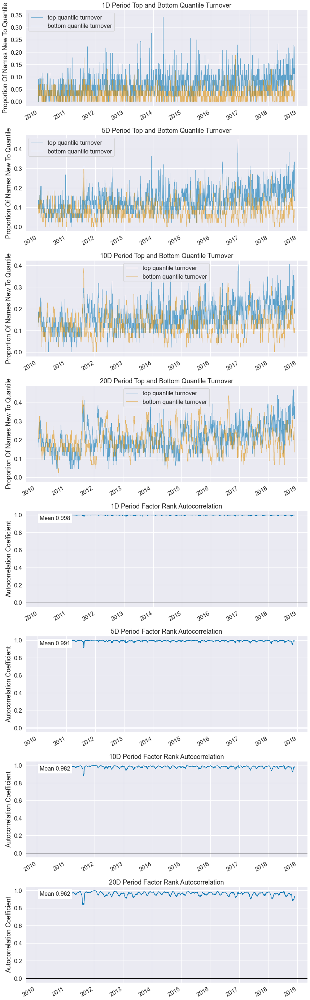

In [28]:
al.tears.create_turnover_tear_sheet(factor_data)

Dropped 7.1% entries from factor data: 7.1% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!
Returns Analysis


,1D,5D,10D,20D
Ann. alpha,0.009,0.010,0.013,0.014
beta,0.090,0.088,0.075,0.079
Mean Period Wise Return Top Quantile (bps),2.207,2.164,2.134,2.209
Mean Period Wise Return Bottom Quantile (bps),-0.428,-0.301,-0.227,-0.320
Mean Period Wise Spread (bps),2.635,2.451,2.347,2.515


<Figure size 1080x504 with 0 Axes>

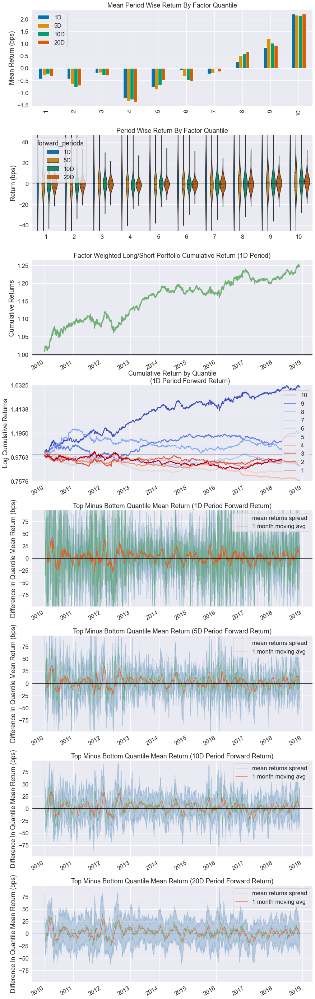

In [29]:
df = adj_factor_df
df.index = df.index.rename(["date", "asset"])

factor_data = al.utils.get_clean_factor_and_forward_returns(
    df[train_start:vali_end]["12M Vol"],
    df[train_start:vali_end]["price"].unstack(),
    quantiles = 10,
    periods = (1,5,10,20),
    filter_zscore = 30
)
al.tears.create_returns_tear_sheet(factor_data)

c:\dev\python\alphalens\alphalens\utils.py:910: UserWarning: Skipping return periods that aren't exact multiples of days.
  warnings.warn(


Turnover Analysis


,1D,5D,10D,20D
Quantile 1 Mean Turnover,0.018,0.049,0.076,0.119
Quantile 2 Mean Turnover,0.044,0.114,0.174,0.269
Quantile 3 Mean Turnover,0.055,0.139,0.212,0.321
Quantile 4 Mean Turnover,0.059,0.148,0.224,0.338
Quantile 5 Mean Turnover,0.062,0.151,0.225,0.333
Quantile 6 Mean Turnover,0.062,0.147,0.217,0.320
Quantile 7 Mean Turnover,0.059,0.131,0.190,0.281
Quantile 8 Mean Turnover,0.055,0.112,0.154,0.220
Quantile 9 Mean Turnover,0.051,0.095,0.124,0.165
Quantile 10 Mean Turnover,0.065,0.124,0.147,0.179


,1D,5D,10D,20D
Mean Factor Rank Autocorrelation,0.999,0.997,0.994,0.986


<Figure size 1080x504 with 0 Axes>

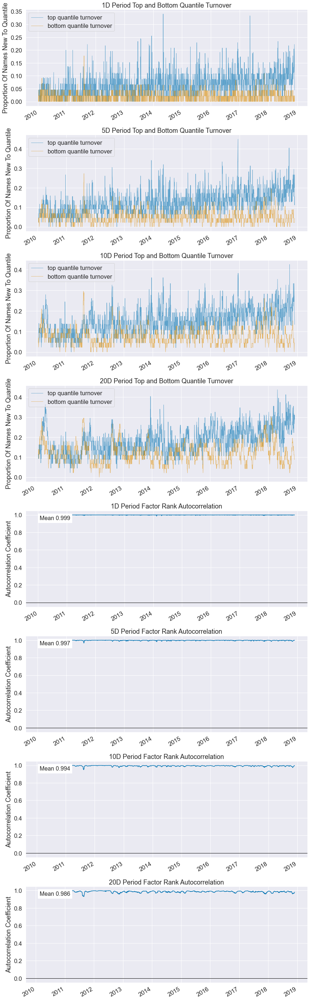

In [30]:
al.tears.create_turnover_tear_sheet(factor_data)

Base on the analysis above of the individual factors, we can conclude a few insights:

1. Momentum shorter than a year might not be a suitable factor as it still exhibits some mean reverting behavior. 

2. Mean reversion factor shows a very persistent pattern and outstanding results in the most recent market regime (before 2019). 

3. Volatility factor suggest that the top quartile of stocks can have the best returns while stocks at the bottom quartile returns were inconclusive. Note that our measure of volatility may be different from volatility measures in academic study which references beta.  

4. When needed to choose only one representitive for each factor, I will go with the longer lookback period as they have a lower turnover ratio.

## Machine Learning Approach

The previous segment shows the analysis of investing in a portfolio of the individual factors seperately. In practice, we rarely manage a portfolio based only on a single factor. Hence, we we need to combine the factors computed above into a factor. The simplest approach is to simply net the values of all the factors $f_i$ into a single value and investing trade the top and bottom quantile of the portfolio. This however assumes that the value of each factor is normally distributed or standardized around the same magnitude, and carries equal importance in predicting our return objective. In our case and in most cases, this is not true. Not only are the factor values not generated in the same magnitude, we do not know that each factor contribute equal signal weights to final portfolio. 



To deal with these theoretical and practical challenges, I have chosen to model the portfolio with the help of regression tree model. Specifically, I will form a long/short equity strategy based on the combined factor values modelled using a regression tree. To provide an intuitive description, suppose each stock observes values for one momentum, one mean-reversion, and one volatility factors denoted as $p_1, p_2, p_3$. Our decision tree model $f(*)$ would take would take factor values as inputs and produce a scalar combine factor value $f$. My intention is to perform this operation on each stock and sort the equites according to this value to form long and short signals. To model the decision tree, we need to choose an objective function to equate the factors to. A hedge fund strategy is not to maximize return at all cost but to provide good risk adjusted return in the form of high sharpe ratio. Hence, I will set the invidual equity sharpe ratios as the objective function such that $f$ also represents the predicted predicted next 5-day sharpe ratio for the given stock. Hence, ranking the combined factor value $f$ equates to ranking the predicted forward 5-day sharpe ratio for all stocks. I am arbitrarily choosing 5-day as it tends to be a sweet spot for rebalancing frequency. The rebalancing frequency is a parameter that can be left for robustness test for the future. 

### Date Preparation

In [14]:
# Sharpe Ratio 
px = data['price_index'][data['close'].notna()]
px_return = px.pct_change(5).shift(-5)
px_std = px.pct_change().shift(-5).rolling(5).std()
sharpe = px_return / px_std
sharpe = sharpe.unstack().swaplevel(0,1).sort_index()

In [15]:
# Add sharpe to factor_df
# df_dict = {adj_factor_df, "new": sharpe}
adj_factor_df = pd.concat([adj_factor_df.loc[train_start:], 
                           sharpe.loc[train_start:]], 
                          axis=1)
adj_factor_df.rename(columns={0:"Sharpe"}, inplace=True)

In [16]:
research_df = adj_factor_df.unstack().resample('5D').first()
research_df.head()

6M MoM                                                   \
                   A AAL       AAP      AAPL ABBV       ABC      ABMD   
date                                                                    
2010-01-04  0.404078 NaN -1.282942 -0.322583  NaN  0.000356 -0.818156   
2010-01-09  0.300176 NaN -1.091329 -0.379050  NaN -0.141481 -0.438126   
2010-01-14  0.285866 NaN -1.283453 -0.366791  NaN -0.036431 -0.635814   
2010-01-19  0.249915 NaN -1.309414 -0.444670  NaN  0.101149 -0.611830   
2010-01-24  0.240946 NaN -1.064807 -0.346469  NaN  0.138192 -0.195546   

                                          ...    Sharpe                      \
                 ABT       ACN      ADBE  ...       XEL      XLNX       XOM   
date                                      ...                                 
2010-01-04  0.146359 -0.093487 -0.102820  ... -0.537617 -2.254933  2.434955   
2010-01-09 -0.073957 -0.007184 -0.227959  ...  2.966801 -1.802720 -3.505613   
2010-01-14  0.282224 -0.075677 -0.454460  ... -2.927820 -0.268856 -5.849851   
2010-01-19  0.349414 -0.094851 -0.393343  ... -3.651611  0.350143 -5.444940   
2010-01-24  0.416450 -0.167573 -0.298863  ...  0.628005 -0.996465  0.332064   

                                                                      
                XRAY XYL       YUM       ZBH      ZBRA      ZION ZTS  
date                                                                  
2010-01-04  1.976258 NaN  0.698131  2.591140 -3.148796  4.429630 NaN  
2010-01-09  0.898159 NaN  1.009826  0.270667  2.485439  1.051650 NaN  
2010-01-14 -3.138360 NaN -6.834681 -1.574614 -1.307044  1.353555 NaN  
2010-01-19 -4.519045 NaN -4.119523 -4.753253 -2.808167  2.938561 NaN  
2010-01-24 -3.117699 NaN  1.764698 -2.680507 -1.584525  3.105094 NaN  

[5 rows x 4040 columns]

In [17]:
df_dict = dict(
    zip(
        research_df.columns.levels[0],
        [research_df[i].unstack().swaplevel(0,1).sort_index() for i in research_df.columns.levels[0]]
    )
)
research_df = pd.concat(df_dict, axis=1, keys=df_dict.keys())

In [18]:
# Drop NA rows 
research_df.dropna(inplace=True)

variable_names = ["6M MoM", "12M MoM", "10D revert", 
                  "20D revert", "6M Vol", "12M Vol"
                 ]
target_name = ["Sharpe"]

In [19]:
X_train = research_df[variable_names].loc[train_start:train_end].values
y_train = research_df[target_name].loc[train_start:train_end].values
X_test = research_df[variable_names].loc[vali_start:vali_end].values
y_test = research_df[target_name].loc[vali_start:vali_end].values

### Train whole dataset on one model 

Without implementing any hyperparameter optimization and tuning, I have modeled a simple baseline regression tree model. Tuning and optimizing the model can be left to the later stages once we are satisfied with this baseline model.  

In [20]:
# Load the above decision tree if this is a new session
regt_model = pickle.load(open("DT_model", 'rb')) 

In [43]:
regt_model = tree.DecisionTreeRegressor(
    criterion = "squared_error",
    min_samples_split = 0.025,
    min_samples_leaf = 0.025,
    max_depth=10
)
regt_model.fit(X_train, y_train)
# cv_score = cross_val_score(estimator=regt, X=X, y=y, cv=tscv, n_jobs=4)

DecisionTreeRegressor(max_depth=10, min_samples_leaf=0.025,
                      min_samples_split=0.025)

Figure below shows the first 5 levels of regression tree branch. The ability to see in detailed how the model predicts the combined factor value also provides transparency for us to make sense of how the model is working. 

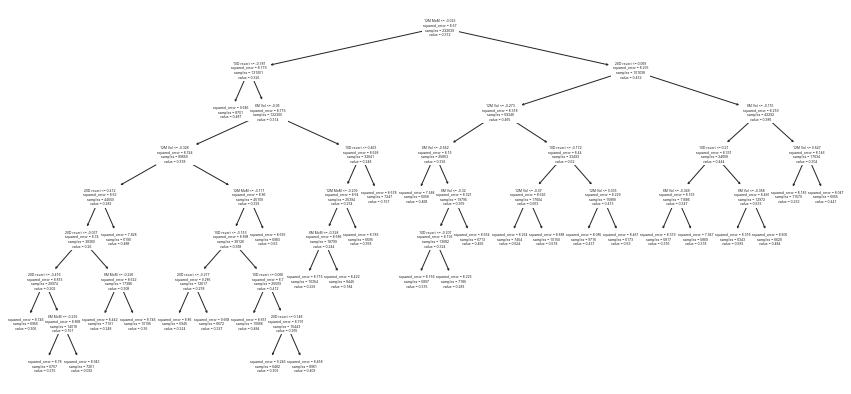

In [44]:
tree.plot_tree(regt_model, feature_names=variable_names, max_depth=8)
plt.show()

In [45]:
# ### Save model as local file
# pickle.dump(regt_model, open("DT_model", 'wb'))

### Validating Performance
The figures below shows the performance of our portfolio when we implement the regression tree during the validation period. Note that each period 1D represents 5 days as we are rebalancing every 5 days. First inspection shows that the mean return at the top and bottom quartile are larger in absolute terms than the individual factors itself. 

Dropped 0.7% entries from factor data: 0.7% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!
Returns Analysis


,1D
Ann. alpha,0.146
beta,0.016
Mean Period Wise Return Top Quantile (bps),11.022
Mean Period Wise Return Bottom Quantile (bps),-6.607
Mean Period Wise Spread (bps),17.630


<Figure size 1080x504 with 0 Axes>

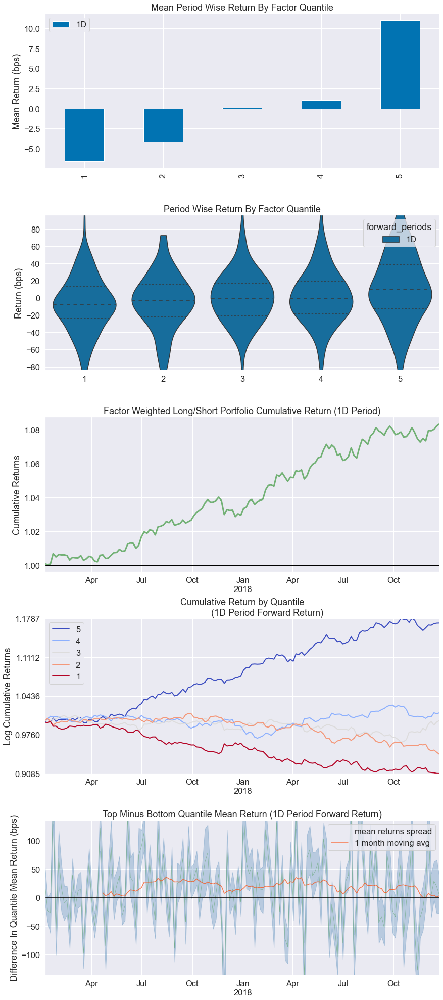

In [46]:
df = research_df.loc[vali_start:vali_end].copy()
df["Pred Sharpe"] = regt_model.predict(X_test)

factor_data = al.utils.get_clean_factor_and_forward_returns(
    df["Pred Sharpe"],
    df["price"].unstack(),
    quantiles = 5,
    periods = (1,),
    filter_zscore = None
)
al.tears.create_returns_tear_sheet(factor_data)

Turnover Analysis


c:\dev\python\alphalens\alphalens\utils.py:910: UserWarning: Skipping return periods that aren't exact multiples of days.
  warnings.warn(


,1D
Quantile 1 Mean Turnover,0.417
Quantile 2 Mean Turnover,0.550
Quantile 3 Mean Turnover,0.497
Quantile 4 Mean Turnover,0.534
Quantile 5 Mean Turnover,0.413


,1D
Mean Factor Rank Autocorrelation,0.552


<Figure size 1080x504 with 0 Axes>

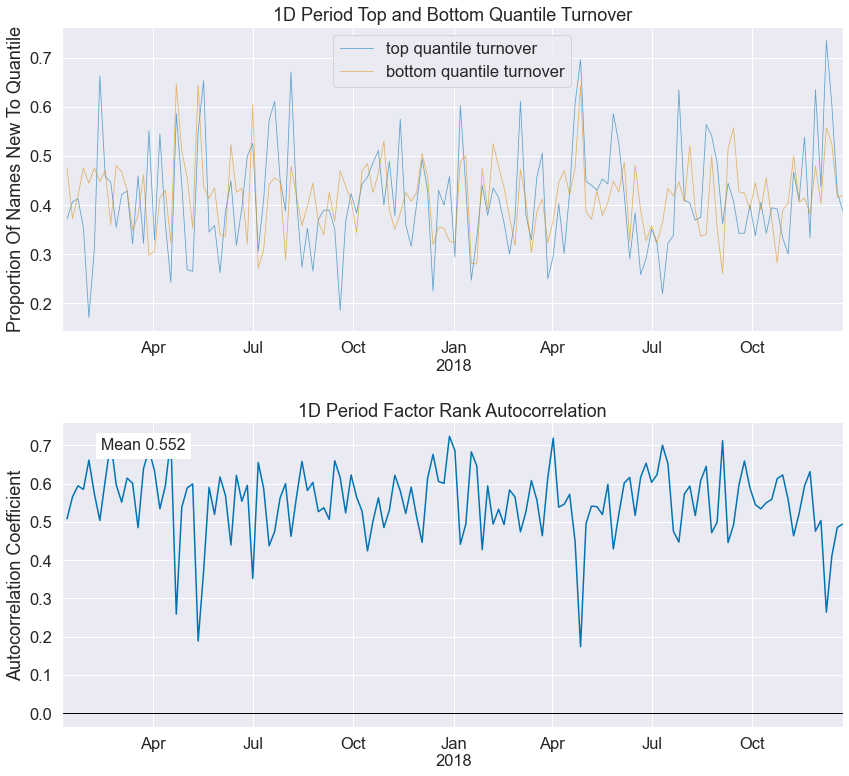

In [47]:
al.tears.create_turnover_tear_sheet(factor_data)

Information Analysis


,1D
IC Mean,0.020
IC Std.,0.088
Risk-Adjusted IC,0.231
t-stat(IC),2.777
p-value(IC),0.006
IC Skew,0.020
IC Kurtosis,-0.621


C:\Users\User\anaconda3\envs\PythonDev\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<Figure size 1080x504 with 0 Axes>

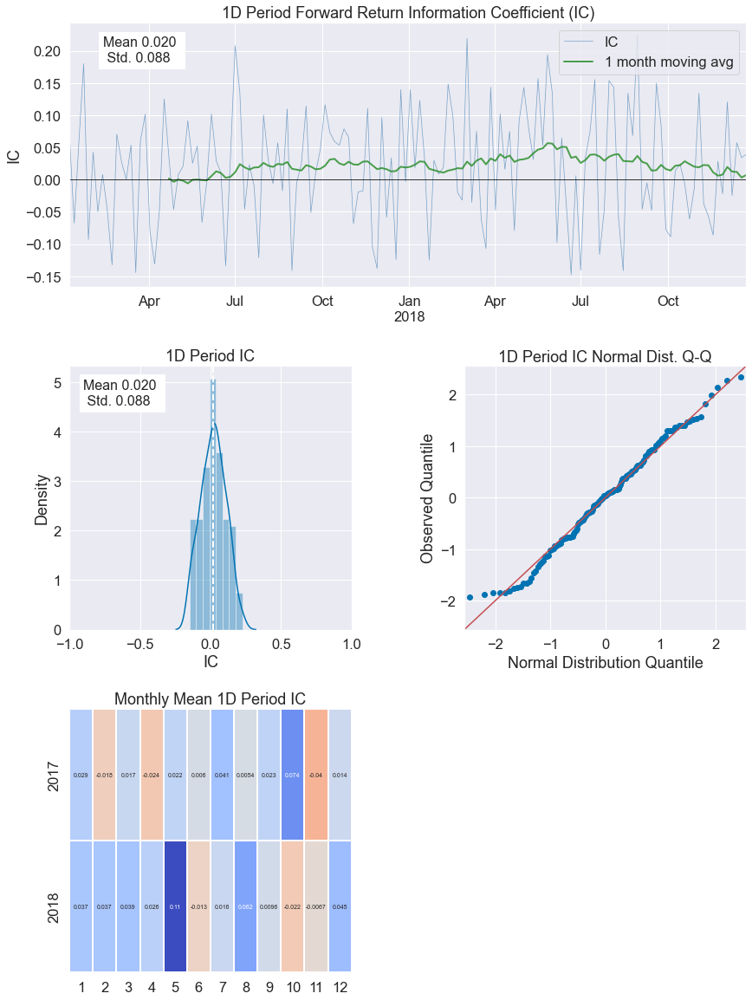

In [48]:
al.tears.create_information_tear_sheet(
    factor_data, 
    group_neutral=False, 
    by_group=False
)

## Backtest Object

### Data Prepration

In [49]:
# Predict Factor Values for validation portion of dataset. 
adj_factor_df = adj_factor_df.sort_index()
backtest_vali = adj_factor_df.loc[vali_start: vali_end].copy()
backtest_vali['net factor score'] = np.nan

data_index = backtest_vali[variable_names].notna().any(1)
forecast = regt_model.predict(
    backtest_vali[data_index][variable_names].values
)
backtest_vali["net factor score"][data_index] = forecast

# Join forecasted factor value back onto price dataframe
df_dict = dict(
    zip(
        ["close", "dividends", "stock splits"],
        [data[i].loc[vali_start: vali_end].unstack().swaplevel(0,1).sort_index(axis=0) for i in ["close", "dividends", "stock splits"]]
    )
)
df_dict["net factor score"] = backtest_vali["net factor score"][data_index]
df = pd.concat(df_dict, axis=1, keys=df_dict.keys())
df = df.unstack().sort_index(axis = 1)

# Rank the combined factor value into quantile
df["net factor score"] = df["net factor score"].fillna(method='ffill')
df["net factor score"] = df["net factor score"] * df["close"].notna()
factor_data = al.utils.get_clean_factor_and_forward_returns(
    df["net factor score"].unstack().swaplevel(0, 1).sort_index(),
    data["price_index"].loc[vali_start:vali_end],
    quantiles = 5,
    periods = (1,),
    filter_zscore = None
)

# Label long and short signals 
factor_data = factor_data["factor_quantile"].unstack().sort_index(axis=0)
factor_data = factor_data.reindex(df.index)
factor_data.fillna(method="ffill", inplace=True)
signal = factor_data.copy() * np.nan

# Fill NA for stocks not yet traded during this period
for i in df['close'].columns:
    if i not in signal.columns:
        signal[i] = np.nan

# Set 1 for top quantile and -1 as bottom quantile for backtester to use as signals
signal[factor_data == 5] = 1
signal[factor_data == 1] = -1

Dropped 3.5% entries from factor data: 3.5% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!


### Backtest Performance
The tearsheet below shows the performance of a backtest that allocates 70% of capital to the taking long positions top quantile and allocates 30% of capital to short positions in the bottom quantile. The backtest covers the period between 2017-01-01 to 2019-12-31 which is our validation portion of data. The backtest shows that a long/short strategy derived from our combined factor signal (shown in either green or orange) produced a sharpe ratio of 1.05. An equal weighted long only portfolio (shown as grey line) of all equities during this period would have produced a Sharpe ratio of 0.79. Note that this does not include any transaction cost, slippage, and assumes that trades can be executed at close price. 

Start date,2017-01-03
End date,2018-12-31
Total months,23
,Backtest
Annual return,6.867%
Cumulative returns,14.146%
Annual volatility,6.575%
Sharpe ratio,1.05
Calmar ratio,0.79
Stability,0.89
Max drawdown,-8.696%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,8.70,2018-08-27,2018-12-24,NaT,NaN
1,4.18,2018-01-26,2018-02-08,2018-02-26,22
2,3.17,2018-03-09,2018-03-28,2018-05-11,46
3,2.41,2017-03-01,2017-04-13,2017-05-10,51
4,2.18,2018-06-12,2018-06-27,2018-07-18,27


Stress Events,mean,min,max
New Normal,0.03%,-1.68%,1.67%


Top 10 long positions of all time,max
MU,1.31%
WDC,1.29%
APA,1.28%
AMD,1.27%
INCY,1.27%
DXCM,1.25%
NWSA,1.25%
INFO,1.24%
STT,1.24%
LYV,1.24%


Top 10 short positions of all time,max
DXCM,-0.39%
ATVI,-0.37%
AKAM,-0.36%
ENPH,-0.35%
ILMN,-0.35%
QRVO,-0.35%
CBRE,-0.35%
TWTR,-0.35%
REGN,-0.35%
DVA,-0.35%


Top 10 positions of all time,max
MU,1.31%
WDC,1.29%
APA,1.28%
AMD,1.27%
INCY,1.27%
DXCM,1.25%
NWSA,1.25%
INFO,1.24%
STT,1.24%
LYV,1.24%


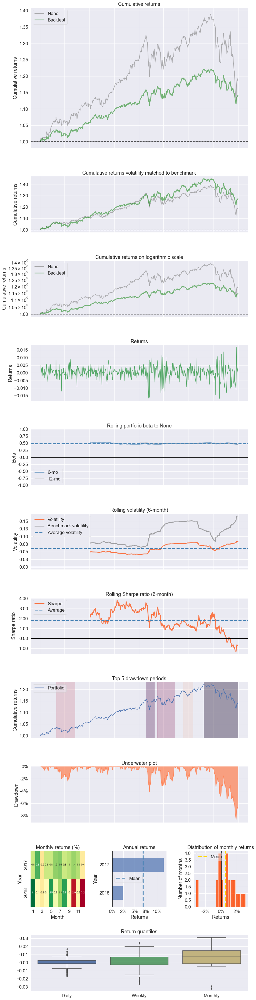

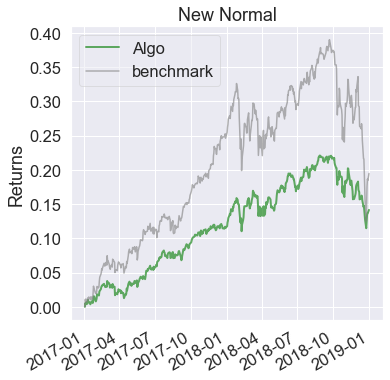

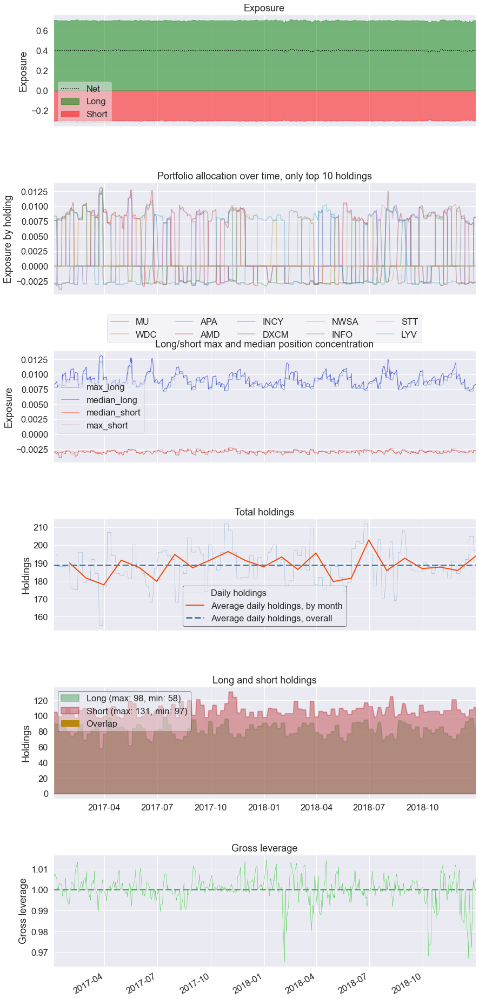

In [54]:
### Backtest Model Performance
backtest = Backtest(10000000, 
                    data = df, 
                    signal = signal, 
                    rebal_freq = 5,
                    ls = (70, 30)
)
position, holdings, performance = backtest.run()

### Universe Benchmark performance
benchmark_signal = (df["close"]/df["close"]) 
benchmark = Backtest(10000000, 
                    data = df, 
                    signal = benchmark_signal, 
                    rebal_freq = 5,
                    ls = (100, 0)
)
_, _, benchmark_perf = benchmark.run()
# universe_final_holdings = universe_holdings.merge(universe_performance["cash"], on="date")

pf.create_full_tear_sheet((performance["cash"] + performance["equities"]).pct_change(), 
                          holdings, 
                          benchmark_rets = (benchmark_perf["cash"] + benchmark_perf["equities"]).pct_change()
)

### Summary
Overall, this notebook demonstrated a long/short equity model that begins with solid intuitive factors and implements statistically sounds methods to combining those factors into a portfolio strategy. Note however, there are many more ways we may be able to improve this model. We outline some examples of what I think can furthur improve the model and portfolio.  

## Robustness Test and Parameter & Hyperparameter Tuning
To test model robustness, I would segment the tast into checking factor robustness, statistical model robustness, and trading model robustness. 

To check for factor robustness, I would replicate the trading model using different lookback periods and verify that our model performance does not drop off rapidly when we make small alterations to the lookback periods.

To check for statistical model robustness, I would implement utilize cross-validation scores to check that our statistical model does not rapidly loose accuracy when we make small changes to its hyperparameters.

To ensure that our trading strategy is robust, we will compare the performance of our strategy versus the performance with simulated transaction cost and splippage. 

## Adding Macro and Fundamental Factors
In addition technical factors, we should begin adding fundamental factors that may make fundamental such as earnings surprise, capex to cashflow, etc to improve the combined factor accuracy. On top of that, we  


## Performance Attribution
After finalizing and backtesting our model, we should also carry out performance attribution analysis to understand what other factors can our portfolio returns be deriving from.

## Out-of sample test
Once we are truely satisfied with the model created, we would perform a backtest on the test data to get an unbiased estimate of the strategy performance. 

In [ ]:
credit_spread = pd.read_csv(
    "CorpSpread.csv", 
    header=[0], 
    index_col=0, 
    parse_dates=True
)
credit_spread["credit risk spread"] = credit_spread["US HY Corp OAS"] - credit_spread["US AA Corp OAS"]

# Spread as variable
credit_spread["3M spread_diff"] = credit_spread["credit risk spread"].diff(21*3)
credit_spread["12M spread_diff"] = credit_spread["credit risk spread"].diff(252)

In [ ]:
df = adj_factor_df.copy().reset_index().set_index("date")
df.rename(columns={"level_1" : "asset"}, inplace=True)

adj_factor_df = pd.merge(
    df.loc[train_start:], 
    credit_spread.loc[train_start:], 
    on = 'date',
    how="outer"
)

adj_factor_df = adj_factor_df.dropna(subset=["asset"])
adj_factor_df = adj_factor_df.set_index("asset", append=True)

In [ ]:
### Create Change in 3 and 12 month credit quality spread
plt.plot(adj_factor_df["3M spread_diff"].loc[:,"A"])